In [1]:
#for plots 

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd

In [3]:
os.chdir(r"..\map_data")

In [4]:
ai = np.load(r"2d_ai.npy")
sand = np.load(r"2d_sand_propotion.npy")
sandy_shale = np.load(r"2d_sandy_shale_propotion.npy")
shale = np.load(r"2d_shale_propotion.npy")
shaly_sand = np.load(r"2d_shaly_sand_propotion.npy")
top_depth = np.load(r"2d_top_depth.npy")


In [5]:
top_depth

array([[3061.78608349, 3061.93972735, 3061.93972735, ..., 3054.6245948 ,
        3054.6245948 , 3054.71546578],
       [3061.80240502, 3061.96331407, 3061.96331407, ..., 3054.75819748,
        3054.75819748, 3054.84575422],
       [3061.80240502, 3061.96331407, 3061.96331407, ..., 3054.75819748,
        3054.75819748, 3054.84575422],
       ...,
       [3057.92411801, 3057.91822399, 3057.91822399, ..., 3057.79205588,
        3057.79205588, 3057.79458394],
       [3057.92411801, 3057.91822399, 3057.91822399, ..., 3057.79205588,
        3057.79205588, 3057.79458394],
       [3057.92054766, 3057.91551587, 3057.91551587, ..., 3057.93997499,
        3057.93997499, 3057.92944058]])

In [6]:
#Location grid
xy = np.linspace(25, 9975, 200)
xx, yy = np.meshgrid(xy, xy)

<function matplotlib.pyplot.show(close=None, block=None)>

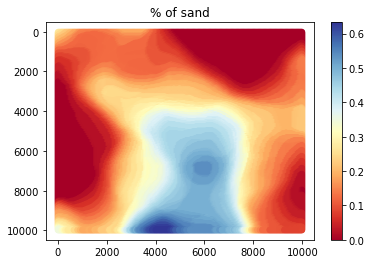

In [7]:
#% Sand facies with color bar

cm = plt.cm.get_cmap('RdYlBu')
sc = plt.scatter(xx, yy, c=sand, cmap=cm)
plt.gca().invert_yaxis()
plt.title("% of sand")
plt.colorbar(sc)
plt.show

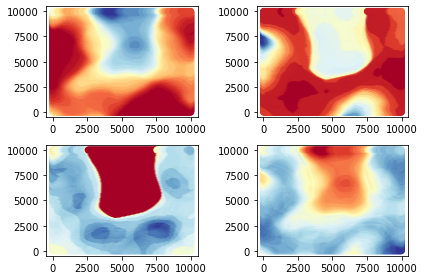

In [8]:
cm = plt.cm.get_cmap('RdYlBu')

fig, axs = plt.subplots(2,2)
axs[0,0].scatter(xx, yy, c=sand, cmap=cm)
axs[0,1].scatter(xx, yy, c=sandy_shale, cmap=cm)
axs[1,0].scatter(xx, yy, c=shale, cmap=cm)
axs[1,1].scatter(xx, yy, c=shaly_sand, cmap=cm)

#sandcol = axs[0,0].pcolor(sand)
#fig.colorbar(sandcol, ax=axs[0,0])

#plt.gca().invert_yaxis()
fig.tight_layout()



In [9]:
h = np.array([[1,2, 3,4]])
y= np.array([[5,6, 7,8]])
np.concatenate((h,y), axis=0)

array([[1, 2, 3, 4],
       [5, 6, 7, 8]])

In [10]:
#3d plot of top depth of the resevoir
import plotly.express as px


ar1 = np.vstack((xx.flatten(), yy.flatten(), (-1)*top_depth.flatten(), sand.flatten())).T
df1 = pd.DataFrame(data=ar1, columns=["X", "Y", "Top Depth", "% Sand"])

fig2 = px.scatter_3d(df1, x="X", y="Y", z="Top Depth", 
                         color="% Sand")
fig2.update_layout(margin=dict(l=10,r=10,t=10))


In [25]:
os.getcwd()

'\\\\JakeHomeNAS\\Backup\\UT\\Hackathon\\MOAR-Drilling'

In [24]:
os.chdir(r"..")

In [45]:
dfPreProd = pd.read_csv(r"well_data/wellbore_data_preproduction_well.csv")
dfProd = pd.read_csv(r"well_data/wellbore_data_producer_wells.csv")
dfProdHist = pd.read_csv(r"prod_data/production_history.csv")

In [30]:
dfPreProd

,Well_ID,"X, m","Y, m","Depth, m","Porosity, fraction","Permeability, mD","Acoustic Impedance, kg*s/m^2",Rock facies,"Density, g/cm3","Compressible velocity, m/s","Youngs modulus, GPa","Shear velocity, m/s","Shear modulus, GPa"
0,Well_no_74,7925,5525,3050.51,NaN,NaN,7842692.077,Sandy shale,NaN,3387.576377,NaN,1646.603549,6.229941
1,Well_no_74,7925,5525,3051.01,0.09096,NaN,7807355.262,Shaly sandstone,1.872982,NaN,NaN,1465.051728,4.930174
2,Well_no_74,7925,5525,3051.51,0.05878,NaN,7864859.402,Sandy shale,3.187123,2660.306664,18.875428,1570.481116,7.202703
3,Well_no_74,7925,5525,3052.01,NaN,NaN,7309508.797,Shaly sandstone,2.058578,3285.615950,26.992396,1652.096739,6.486131
4,Well_no_74,7925,5525,3052.51,0.12285,NaN,7328552.658,Shaly sandstone,1.678339,4432.429019,35.261378,1697.320552,3.802001
...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,Well_no_83,6375,3725,3055.60,0.14881,148.679689,6831566.178,Sandstone,2.137782,3325.937404,NaN,1753.017481,NaN
196,Well_no_83,6375,3725,3056.10,NaN,NaN,7106579.168,Sandstone,2.356128,3026.561084,25.395808,1644.259998,NaN
197,Well_no_83,6375,3725,3056.60,0.16041,NaN,7058678.769,Sandstone,1.593845,4219.472157,30.200434,1601.108802,4.634619
198,Well_no_83,6375,3725,3057.10,NaN,189.001076,7043097.566,Sandstone,1.490938,4570.820320,31.485428,1583.303027,5.610245


In [31]:
dfPreProd.describe()

,"X, m","Y, m","Depth, m","Porosity, fraction","Permeability, mD","Acoustic Impedance, kg*s/m^2","Density, g/cm3","Compressible velocity, m/s","Youngs modulus, GPa","Shear velocity, m/s","Shear modulus, GPa"
count,200.00000,200.000000,200.000000,176.000000,48.000000,1.870000e+02,163.000000,168.000000,167.000000,174.000000,176.000000
mean,7385.00000,4505.000000,3053.751000,0.128725,125.222460,7.310066e+06,2.033922,3687.544636,27.473558,1668.404041,5.809301
std,845.26467,489.179397,3.194208,0.038333,83.653397,3.268901e+05,0.386902,701.744626,5.690831,90.723222,1.373386
min,6025.00000,3725.000000,3046.740000,0.048450,12.856300,6.617929e+06,1.482503,2227.976873,16.535378,1425.170622,2.463956
25%,6825.00000,4125.000000,3051.255000,0.112465,59.368014,7.077094e+06,1.743189,3147.725651,23.215547,1602.559296,4.908638
50%,7475.00000,4450.000000,3053.750000,0.139425,109.536687,7.234540e+06,2.000809,3596.591856,26.610583,1666.323874,5.722072
75%,7925.00000,4825.000000,3056.245000,0.156935,168.879200,7.498666e+06,2.243124,4220.013876,31.188682,1731.496253,6.674499
max,9025.00000,5525.000000,3061.170000,0.183970,322.668020,8.108090e+06,3.508268,5320.215562,43.904056,1909.246524,10.338148


In [32]:
dfPreProd[dfPreProd['Permeability, mD'].isnull()]

,Well_ID,"X, m","Y, m","Depth, m","Porosity, fraction","Permeability, mD","Acoustic Impedance, kg*s/m^2",Rock facies,"Density, g/cm3","Compressible velocity, m/s","Youngs modulus, GPa","Shear velocity, m/s","Shear modulus, GPa"
0,Well_no_74,7925,5525,3050.51,NaN,NaN,7842692.077,Sandy shale,NaN,3387.576377,NaN,1646.603549,6.229941
1,Well_no_74,7925,5525,3051.01,0.09096,NaN,7807355.262,Shaly sandstone,1.872982,NaN,NaN,1465.051728,4.930174
2,Well_no_74,7925,5525,3051.51,0.05878,NaN,7864859.402,Sandy shale,3.187123,2660.306664,18.875428,1570.481116,7.202703
3,Well_no_74,7925,5525,3052.01,NaN,NaN,7309508.797,Shaly sandstone,2.058578,3285.615950,26.992396,1652.096739,6.486131
4,Well_no_74,7925,5525,3052.51,0.12285,NaN,7328552.658,Shaly sandstone,1.678339,4432.429019,35.261378,1697.320552,3.802001
...,...,...,...,...,...,...,...,...,...,...,...,...,...
192,Well_no_83,6375,3725,3054.10,0.13340,NaN,7351704.165,Sandstone,1.940368,3712.674821,NaN,NaN,6.307415
193,Well_no_83,6375,3725,3054.60,0.14152,NaN,7108144.119,NaN,1.774221,3781.314880,27.986082,1586.807103,4.216510
194,Well_no_83,6375,3725,3055.10,0.14993,NaN,7128094.432,Sandstone,1.587580,4699.910530,34.750596,1697.231699,NaN
196,Well_no_83,6375,3725,3056.10,NaN,NaN,7106579.168,Sandstone,2.356128,3026.561084,25.395808,1644.259998,NaN


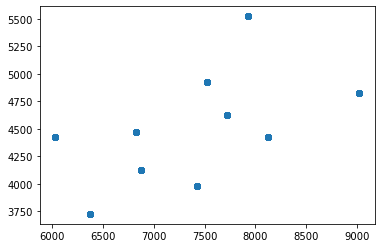

In [17]:
plt.scatter(dfPreProd["X, m"], dfPreProd["Y, m"])

In [49]:
dfProd.describe()

,"X, m","Y, m","Depth, m","Porosity, fraction","Permeability, mD","Acoustic Impedance, kg*s/m^2","Density, g/cm3","Compressible velocity, m/s","Youngs modulus, GPa","Shear velocity, m/s","Shear modulus, GPa"
count,1460.000000,1460.000000,1460.000000,1268.000000,284.000000,1.357000e+03,1248.000000,1276.000000,1261.000000,1270.000000,1285.000000
mean,4188.698630,5770.890411,3055.810959,0.127746,112.182739,7.325786e+06,2.052521,3688.657853,27.288877,1676.158075,5.752640
std,1771.495039,2389.773641,4.353335,0.036020,80.894436,3.101125e+05,0.417622,727.216238,5.424608,100.630094,1.518699
min,1175.000000,775.000000,3045.620000,0.040270,2.214604,6.559277e+06,1.421943,1661.828496,13.205134,1307.887097,1.650985
25%,2925.000000,3825.000000,3052.720000,0.113953,51.540980,7.111056e+06,1.734052,3178.389486,23.466538,1608.928309,4.757475
50%,3875.000000,6125.000000,3055.790000,0.137495,93.980722,7.274333e+06,1.988542,3664.196826,26.647466,1674.836574,5.610267
75%,5325.000000,7625.000000,3058.982500,0.152325,154.584890,7.503378e+06,2.229507,4214.924966,30.874629,1746.081251,6.600503
max,7975.000000,9775.000000,3066.300000,0.188910,489.219402,8.249272e+06,3.530373,6179.653016,48.123292,1989.829247,11.820038


In [75]:
#New Df with dropped NAs for Por and AI to averages, JUST FOR TESTING
dfProdDropped = dfProd.fillna(dfProd.mean())
#.set_index("Well_ID")
dfProdDropped

,Well_ID,"X, m","Y, m","Depth, m","Porosity, fraction","Permeability, mD","Acoustic Impedance, kg*s/m^2",Rock facies,"Density, g/cm3","Compressible velocity, m/s","Youngs modulus, GPa","Shear velocity, m/s","Shear modulus, GPa"
0,Well_no_1,7325,7175,3052.80,0.133300,112.182739,6.981172e+06,Sandstone,2.280137,3106.544655,24.721555,1690.417133,7.304717
1,Well_no_1,7325,7175,3053.30,0.138650,112.182739,7.234749e+06,Sandstone,2.135061,4003.697087,23.360728,1573.847967,5.202120
2,Well_no_1,7325,7175,3053.80,0.146380,112.182739,7.157384e+06,Sandstone,1.991045,3462.569030,28.232152,1636.279139,5.752640
3,Well_no_1,7325,7175,3054.30,0.127746,112.182739,7.325786e+06,Sandstone,1.694242,3836.960702,29.220132,1613.043048,5.074763
4,Well_no_1,7325,7175,3054.80,0.149930,112.182739,7.325786e+06,Sandstone,1.664371,3919.585777,27.288877,1636.846284,5.277834
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,Well_no_73,7975,7525,3062.64,0.162890,200.747596,7.055226e+06,Sandstone,2.092585,3413.160157,22.650756,1433.648193,5.527209
1456,Well_no_73,7975,7525,3063.14,0.159090,112.182739,7.150563e+06,Sandstone,2.109057,3315.647993,22.067756,1665.711440,5.752640
1457,Well_no_73,7975,7525,3063.64,0.156920,112.182739,6.978004e+06,Sandstone,1.620103,3978.875885,34.903631,1627.187093,3.044917
1458,Well_no_73,7975,7525,3064.14,0.157370,112.182739,7.014957e+06,Sandstone,1.759469,3688.657853,28.898905,1711.886682,5.013303


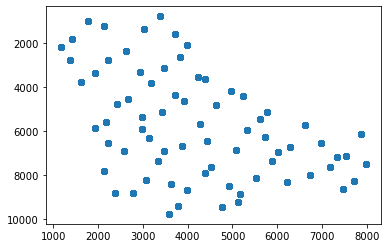

In [76]:
plt.scatter(dfProd['X, m'], dfProd['Y, m'])
plt.gca().invert_yaxis()

In [78]:
#3d plot of wells
import plotly.express as px

dfp = dfProdDropped.copy()
dfp['Depth, m'] = (-1)*dfp['Depth, m']

fig2 = px.scatter_3d(dfp, x="X, m", y="Y, m", z="Depth, m", color="Well_ID")
fig2.update_layout(margin=dict(l=10,r=10,t=10))


In [50]:
dfProdHist.describe()

,"Cumulative oil production (1 yr), MSTB","Cumulative oil production (2 yr), MSTB","Cumulative oil production (3 yr), MSTB","Cumulative Water production (1 yr), MSTB","Cumulative Water production (2 yr), MSTB","Cumulative Water production (3 yr), MSTB"
count,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000
mean,485.980959,753.475068,940.976027,371.454164,963.271370,1686.666575
std,228.360824,350.143363,429.622150,201.985319,450.381707,742.120317
min,159.480000,244.120000,307.120000,82.224000,247.250000,465.380000
25%,323.710000,511.250000,643.140000,222.510000,647.160000,1195.500000
50%,437.640000,667.440000,819.490000,318.220000,855.010000,1591.400000
75%,594.430000,944.820000,1185.400000,523.660000,1243.100000,2127.700000
max,1289.800000,2015.500000,2514.500000,1001.300000,2282.400000,3862.400000


Start with some basic ML

In [65]:
import math                                               # basic calculations like square root
from sklearn.model_selection import train_test_split      # train and test split
from sklearn import tree                                  # tree program from scikit learn (package for machine learning)
from sklearn.metrics import mean_squared_error            # specific measures to check our models
import seaborn as sns                                     # density plots

In [66]:
def visualize_model(model,xfeature,x_min,x_max,yfeature,y_min,y_max,response,z_min,z_max,title,):# plots the data points and the decision tree prediction 
    cmap = plt.cm.inferno
    xplot_step = (x_max - x_min)/300.0; yplot_step = (y_max - y_min)/300.0 # resolution of the model visualization
    xx, yy = np.meshgrid(np.arange(x_min, x_max, xplot_step), # set up the mesh
                     np.arange(y_min, y_max, yplot_step))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])      # predict with our trained model over the mesh
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=cmap,vmin=z_min, vmax=z_max, levels = 50) # plot the predictions
    # add the data values as a colored by response feature scatter plot
    im = plt.scatter(xfeature,yfeature,s=None, c=response, marker=None, cmap=cmap, norm=None, vmin=z_min, vmax=z_max, alpha=0.8, linewidths=0.3, verts=None, edgecolors="white")
    plt.title(title)                                       # add the labels
    plt.xlabel(xfeature.name); plt.ylabel(yfeature.name)
    plt.xlim([x_min,x_max]); plt.ylim([y_min,y_max])
    cbar = plt.colorbar(im, orientation = 'vertical')      # add the color bar
    cbar.set_label(response.name, rotation=270, labelpad=20)
    return(plt)

In [67]:
#Getting preditor and response variables
X = dfProdDropped[["Porosity, fraction", "Acoustic Impedance, kg*s/m^2"]]
y = dfProdHist[['Cumulative oil production (3 yr), MSTB']]

In [68]:
#Constraints
por_min = 0.0; por_max = 0.20
AI_min = 0.0; AI_max = 10.0e+06
prod_min = 0.0; prod_max = 10000.0
cmap = plt.cm.get_cmap('RdYlBu')
error_min = -4000.0; error_max = 4000.0
nbin = 30

In [69]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=None) # train and test split
n_train = len(X_train)
n_test = len(X_test)
print('Number of training ' + str(n_train) + ', number of test ' + str(n_test))

ValueError: Found input variables with inconsistent numbers of samples: [1460, 73]

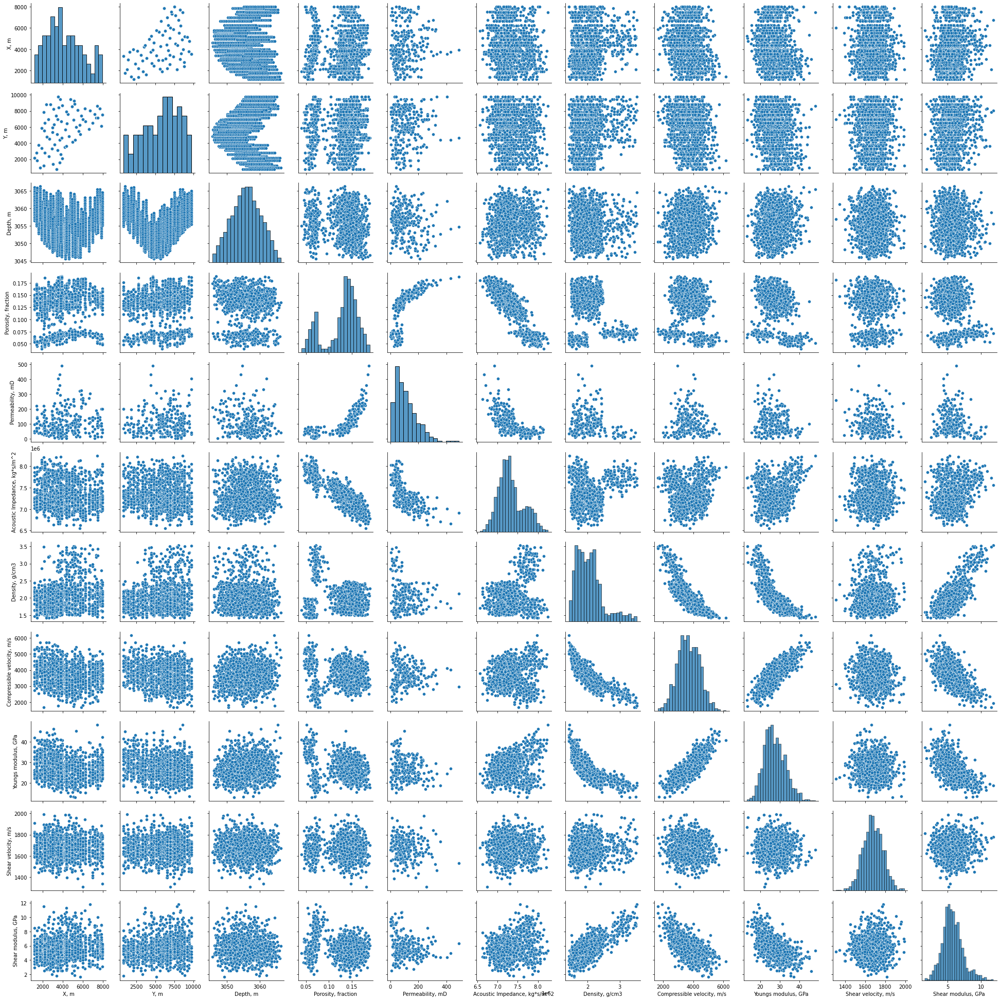

In [81]:
sns.pairplot(dfProd)

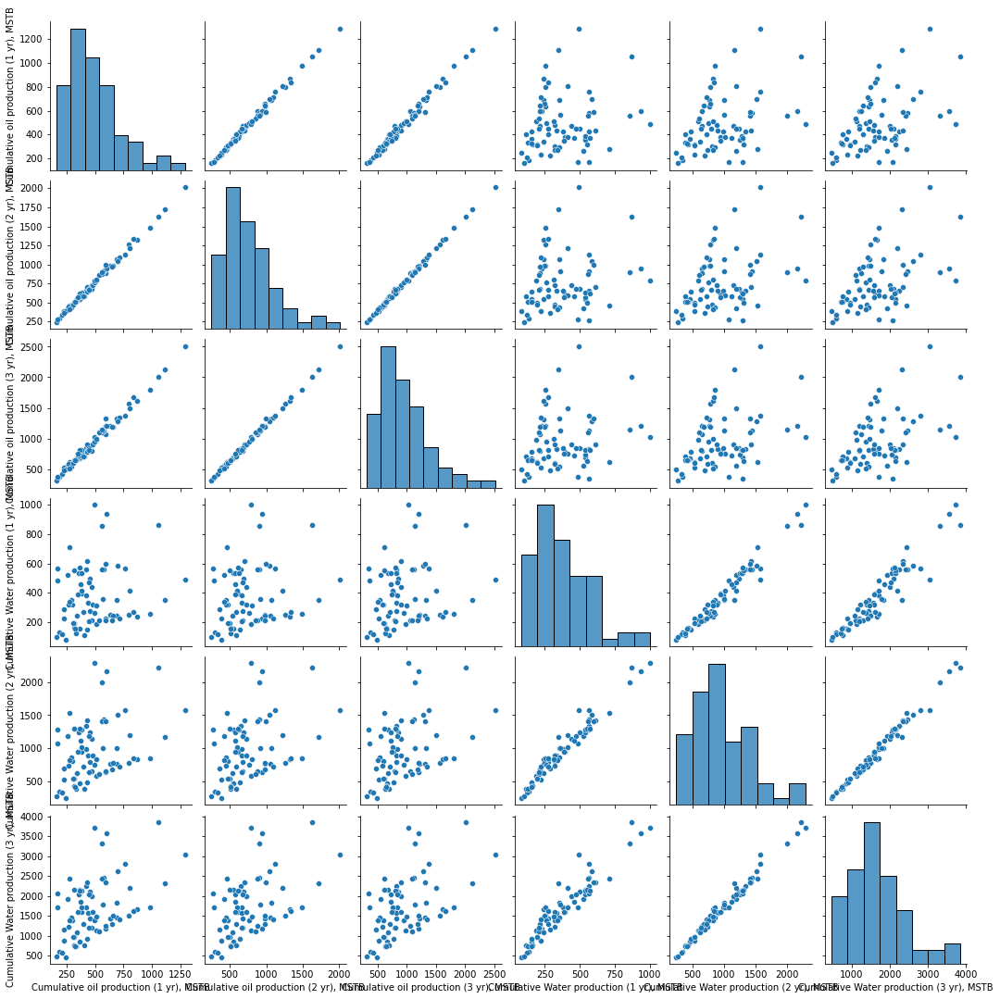

In [83]:
sns.pairplot(dfProdHist)